# Reliability of PTV Code Analysis File
Authour: Isabella Tranquilino (s4005248)

(**NOTE:** Snippets of code had been retrieved from the COSC2671 Social Media & Network Analytics workshops and has been adapted to fit this task)

Retrieving data from the subreddit **r/MelbourneTrains**

## Loading and Viewing Data

In [1]:
import matplotlib.pyplot as plt
import praw
from collections import Counter
import pandas as pd
from datetime import datetime, timedelta, timezone
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import csv
from collections import Counter
import string
import re
from nltk import bigrams
import json
import numpy as np
import math
import pyLDAvis
import pyLDAvis.lda_model
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
from nltk.tokenize import TweetTokenizer
import codecs
from colorama import Fore, Style
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import community as community
import random
from googleapiclient.discovery import build
from googleapiclient.errors import HttpError
from collections import defaultdict

%load_ext autoreload
%autoreload 1
%aimport redditClient

In [ ]:
%load_ext autoreload
%autoreload 1

# we are importing RedditProcessing.py and its contents
%aimport RedditProcessing

In [2]:
!pip install --upgrade praw
print(praw.__file__)

C:\Users\belle\anaconda3\Lib\site-packages\praw\__init__.py


DEPRECATION: fairness 0.1.8 has a non-standard dependency specifier BlackBoxAuditing>=0.1.26ggplot. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of fairness or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [ ]:
!pip install google-api-python-client

In [4]:
#----------------- calling reddit client ----------------------
from redditClient import redditClient
client = redditClient()
print(client.user.me())

iaisaa


In [5]:
# specify which subreddit we are interested in
subreddit = client.subreddit('MelbourneTrains')

### Collecting Data Sample (for Reliability question) before Pre-processing

In [6]:
#----------------- collecting 100 hot samples in a csv file --------------------

# fetching 100 hot posts and its information
post_data = [] # list to store information of each post

for submission in subreddit.hot(limit=100): # taking 100 samples
    post_data.append({
        "title": submission.title, #title of the post
        "score": submission.score, #the upvotes and downvotes of the post
        "url": submission.url, #URL of the post
        "num_comments": submission.num_comments, #number of comments under the post
        "author": str(submission.author), #author of the post
        "created_utc": submission.created_utc, #time of publishing the post
        "text": submission.selftext #body of text of the post
    })

# checking if post information was appended by viewing first hot post
print(post_data[0])

# saving 100 posts sample to a csv file
samp100 = pd.DataFrame(post_data)
samp100.to_csv("melb_trains_data_sample.csv", index=False)


{'title': 'BANNED POSTS', 'score': 85, 'url': 'https://www.reddit.com/r/MelbourneTrains/comments/15l9aps/banned_posts/', 'num_comments': 28, 'author': 'SpicyMemes0903', 'created_utc': 1691474568.0, 'text': 'It has been decided that a couple of Topics/Types of posts will banned from today.\n\n\nScreenshots of Metro Notify/PTV or simply repeating what those channels have said in your post. Does not constitute reasonable discussion and will be removed.\n\nIf this is something enough of you are interested a Daily thread could be set up where you will be allowed to talk about it.\n\nPosts complaining or pointing out broken HTML Images on certain HCMT Sets. We get it. Posts like this will be removed. \n\nThanks'}


In [7]:
#-------------- fetching posts and comments in r/Costco from the last 60 days
def get_posts(sSubredditName, days=60, limit=None):
    """
    gets posts from a specified subreddit within a given number of days.
    
    Args:
        subreddit_name (str): The name of the subreddit to fetch posts from.
        days (int): The number of days to look back for posts.
        limit (int): The maximum number of posts to fetch.
    
    Returns:
        list: A list of dictionaries where each dictionary contains post data and comments.
    """

    # access specific subreddit
    subreddit = client.subreddit(sSubredditName)

    # calculate the time range for fetching posts
    end_time = datetime.now(timezone.utc)
    start_time = end_time - timedelta(days=days)
    
    posts = []
    try:

        #iterate through new submissions in the subreddit
        for submission in subreddit.new(limit=limit):
            post_time = datetime.fromtimestamp(submission.created_utc, tz=timezone.utc)
            if post_time < start_time:
                # break loop if post is older than the start time
                break

            # create a dictionary for each post
            post_data = {
                'title': submission.title,
                'score': submission.score,
                'created_date': post_time.strftime('%Y-%m-%d %H:%M:%S'),
                'url': submission.url,
                'comments': []
            }

            # fetch all comments from the posts
            submission.comments.replace_more(limit=0)
            for comment in submission.comments.list():
                comment_time = datetime.fromtimestamp(comment.created_utc, tz=timezone.utc)
                post_data['comments'].append({
                    'body': comment.body,
                    'created_date': comment_time.strftime('%Y-%m-%d %H:%M:%S')
                })

            # append posts data to the list
            posts.append(post_data)
    except Exception as e:
        # an error message will be printed out if an error occurs in the try method
        print(f"An error occurred: {e}")

    return posts

In [8]:
# ---------------- average post/comment daily ---------------------
def average_per_day(total_count, days):
    """
    calculates the average number of posts or comments per day.
    
    Args:
        total_count (int): The total count of posts or comments.
        days (int): The number of days over which the count is averaged.
    
    Returns:
        float: Average count per day.
    """
    return total_count / days if days > 0 else 0


In [9]:
#----------------- fetching posts and comments under the r/Costco subreddit for 60 days (approx. 2 month) -----------
sSubredditName = 'MelbourneTrains'
posts = get_posts(sSubredditName, days=60, limit=1000) # fetching the posts for 60 days


In [10]:
# checking if data successfully fetched by printing the 25 hot submissions
for submission in subreddit.hot(limit=25):
    print(submission.title)

BANNED POSTS
Discord server
How do use trams?
Retrofitted info board with new solar panel and e-ink screen
Another Puffing Billy item
End of the line
Preston, today
SSR transferring 14 retired V/Line carriages off to Bendigo tonight
Steamrail's R711 getting a lift in Geelong
H... What on earth
New card readers rolling out on the Upfield line
Is Flinders Street Station safe at night?
Bendigo to Ballarat via Maryborough Route Idea
Few Film Photos
Geelong Improvements
If you were given 100 Billion dollars and unlimited resources to get Melbournes Metro/rail system back on track, what projects would you do?
Is there a website that has all of the metro trains melbourne signs, symbols and fonts?
Early Narrow Gauge
D1.3512 on Route 19 this morning
Trains departing early from the stations
Im desperate for a train sign
Unclear information about disruptions by vline conductors
1955 Peninsula Bus Lines timetable.
Someone getting exposed at laverton station 💀
The prophecy is being fulfilled, (Bins

In [11]:
#----------------- checking posts and comments under the r/MelbourneTrains subreddit
posts_count = len(posts) # length of posts
comments_count = sum(len(p['comments']) for p in posts) # sum of all comments under all posts
posts_comments_count = posts_count + comments_count # total number of posts and comments in the subreddit

print(f"Collected a total of combined {posts_comments_count} posts and their comments from r/{sSubredditName} over the last 60 days.")
print(f"Total posts: {posts_count}")
print(f"Total comments: {comments_count}")
print(f"Average posts daily: {average_per_day(posts_count, 60)}")
print(f"Average comments daily: {average_per_day(comments_count, 60)}")

Collected a total of combined 14653 posts and their comments from r/MelbourneTrains over the last 60 days.
Total posts: 669
Total comments: 13984
Average posts daily: 11.15
Average comments daily: 233.06666666666666


A total collection of {{posts_comments_count}} combined posts and comments within 60 days reaches a reasonable amount for effective and credible analysis into the subreddit. (approx. over 10000 total is considered the minimum for a credible analysis)

## Data Pre-processing
Code snippets in this section is sourced from COSC2671 **week 3 workshop** and modified to fit the task at hand.

In [13]:
# --------------- saving melbourne trains reddit data into json file for processing --------------
line = []
for post in posts:
    for comment in post['comments']:
        line.append({
            'post_title': post['title'],
            'post_score': post['score'],
            'post_created_date': post['created_date'],
            'post_url': post['url'],
            'comment_body': comment['body'],
            'comment_created_date': comment['created_date']
        })

#saving as JSON
with open("melb_trains_reddit_data.json", "w", encoding='utf-8') as f:
    json.dump(line, f, ensure_ascii=False, indent=4)
    

In [14]:
# ------------------ preprocessing steps ----------------
def processText(text, tokenizer, lemmatizer, stopwords):
    """
    Perform tokenisation, normalisation (lower case and stemming) and stopword and twitter keyword removal.

    @param text: reddit submission or comment text
    @param tokenizer: tokeniser used.
    @param stemmer: stemmer used.
    @param stopwords: list of stopwords used

    @returns: a list of processed tokens
    """

    # covert all to lower case
    text = text.lower()
    # tokenise
    lTokens = tokenizer.tokenize(text)
    # strip whitespaces before and after
    lTokens = [token.strip() for token in lTokens]
    # lemmatisation (we use set to remove duplicates)
    lLemmatizedTokens = set([lemmatizer.lemmatize(tok) for tok in lTokens]) # lemmatiser was chosen over stemming as it seemed to produce better results


    # remove stopwords, digits
    return [tok for tok in lLemmatizedTokens if tok not in stopwords and not tok.isdigit()]


In [15]:

fJsonName = 'melb_trains_reddit_data.json'

# number of most frequent terms to display
freqNum = 50

# tweet tokeniser to use
tweetTokeniser = nltk.tokenize.TweetTokenizer()
# use the punctuation symbols defined in string.punctuation
lPunct = list(string.punctuation)
# use stopwords from nltk and a few other twitter specific terms like 'rt' (retweet)
lStopwords = nltk.corpus.stopwords.words('english') + lPunct + ['via']
# we use the popular Porter stemmer
tweetLemmatizer = WordNetLemmatizer()

#terms to filter out
filter_out_terms = {'feel', 'v', 'ha', 'wa', 'oh', 'actually', 'comeng', 'melbourne', 'train',\
                   'need', 'still', 'make', 'would', 'like', 'get', 'also', 'think', 'one'} # terms like 'melbourne' is irrelevant as it doesnt add any meaningful contributions and only adds noise
regex_pattern = r"[{}’…]".format(re.escape(string.punctuation)) # using regex to remove punctuation


# our term frequency counter
termFreqCounter = Counter()
processedPosts = []

#------------ processing reddit data ------------------
with open(fJsonName, 'r', encoding='utf-8') as f:
    data = json.load(f)
    for submission in data:
        submissionTitle = submission.get('post_title', '')
        submissionTitle = re.sub(regex_pattern, ' ', submissionTitle)

        # tokenise, filter stopwords and convert to lowercase
        lTokens = processText(submissionTitle, tweetTokeniser, tweetLemmatizer, lStopwords)
        filteredTokens = [token for token in lTokens if token not in filter_out_terms and token not in lStopwords]
        termFreqCounter.update(filteredTokens)
        processedPosts.append(" ".join(filteredTokens))


In [16]:
#--------------- print top 50 terms -----------------
for term, count in termFreqCounter.most_common(freqNum):
    print(term + ': ' + str(count))

station: 1863
line: 1367
metro: 1143
new: 937
rail: 878
bus: 783
tunnel: 740
myki: 674
tram: 650
srl: 643
sunshine: 522
first: 494
service: 455
network: 451
southern: 443
cross: 440
upgrade: 433
public: 418
reader: 409
city: 408
pretty: 395
transport: 394
time: 389
pt: 388
free: 366
year: 357
back: 323
loop: 318
platform: 305
replacement: 292
stop: 292
thought: 285
airport: 278
ptv: 269
built: 268
future: 267
project: 266
dutton: 257
melton: 253
town: 251
small: 234
know: 232
cost: 229
dystopian: 223
budget: 222
map: 221
worst: 220
track: 218
anyone: 205
argument: 201


In [17]:
#--------------- print top 50 bigrams -----------------
bigramFreqCounter = Counter()

for post in processedPosts:
    tokens = post.split()
    bigramFreqCounter.update(bigrams(tokens))
    
for bg, count in bigramFreqCounter.most_common(freqNum):
    print(" ".join(bg) + ': ' + str(count))


sunshine station: 309
reader new: 256
first time: 246
station upgrade: 235
new myki: 233
small town: 223
town dystopian: 223
dystopian first: 223
time pretty: 223
pretty year: 223
transport public: 208
free argument: 201
argument pt: 201
pt stop: 201
dutton funding: 190
funding scrap: 190
scrap srl: 190
srl sunshine: 190
line station: 178
airport tunnel: 172
station impressive: 172
impressive back: 172
back looked: 172
looked first: 172
first even: 172
even cross: 172
cross built: 172
built imo: 172
imo shithole: 172
shithole pretty: 172
pretty southern: 172
blitz service: 123
service airport: 123
tunnel pt: 123
pt metro: 123
metro rail: 123
vlocity line: 123
line warrnambool: 123
warrnambool situation: 123
wyndham vale: 114
encourage transport: 103
transport use: 103
use ride: 103
ride public: 103
public park: 103
park myth: 103
cross worst: 102
worst platform: 102
platform city: 102
city station: 102


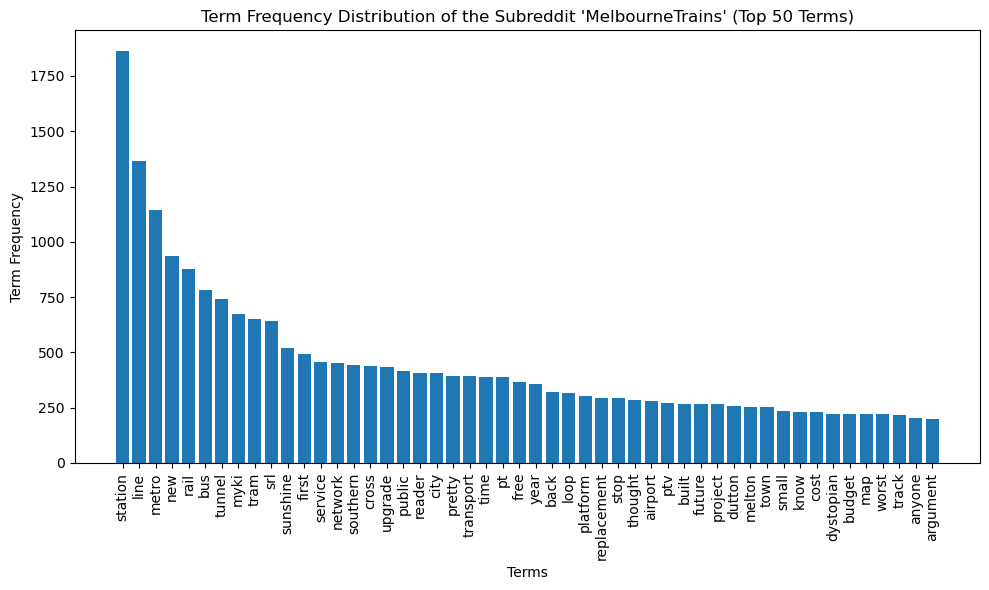

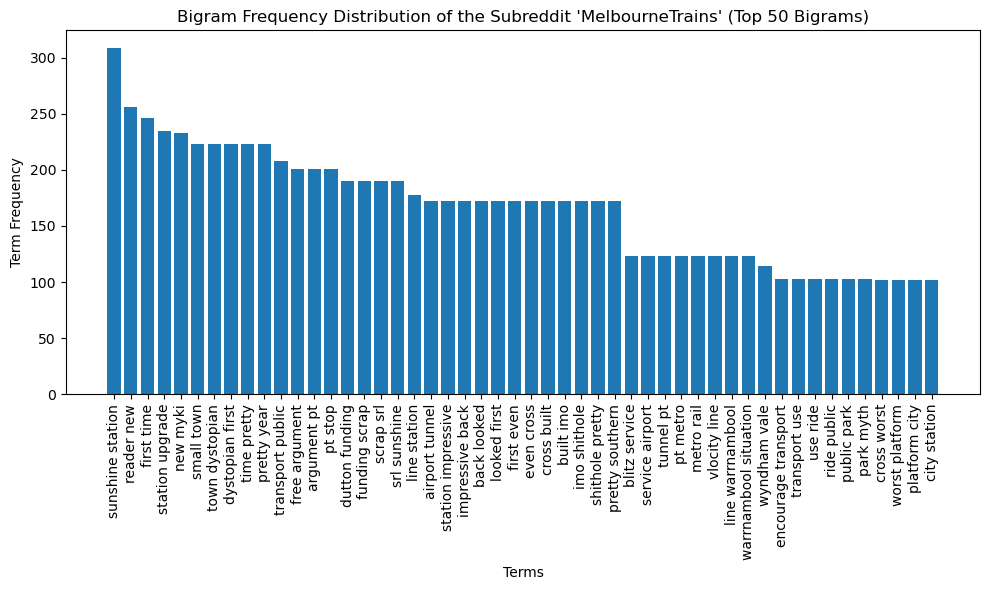

In [18]:
#----------------------- visualising term freq distribution ------------------
terms, counts = zip(*termFreqCounter.most_common(freqNum))  # Extract terms and their frequencies

plt.figure(figsize=(10, 6))
plt.bar(terms, counts)
plt.xticks(rotation=90)
plt.xlabel("Terms")
plt.ylabel("Term Frequency")
plt.title(f'Term Frequency Distribution of the Subreddit \'MelbourneTrains\' (Top {freqNum} Terms)')  
plt.tight_layout() 
plt.show()

#----------------------- visualising bigram freq distribution ------------------
bgs, counts = zip(*bigramFreqCounter.most_common(freqNum))  # Extract terms and their frequencies
bgs = [' '.join(bg) for bg in bgs]  

plt.figure(figsize=(10, 6))
plt.bar(bgs, counts)
plt.xticks(rotation=90)
plt.xlabel("Terms")
plt.ylabel("Term Frequency")
plt.title(f'Bigram Frequency Distribution of the Subreddit \'MelbourneTrains\' (Top {freqNum} Bigrams)')  
plt.tight_layout() 
plt.show()


PTV's Metro along with specific train 'stations' seems to be a popular and very frequent topic within this subreddit.

## Topic Modelling (LDA)

In [20]:
#
# LDA parameters
#

# number of topics to discover (default = 10)
topicNum = 6
# maximum number of words to display per topic (default = 10)
# Answer to Exercise 1 (change from 10 to 15)
wordNumToDisplay = 15
# this is the number of features/words to used to describe our documents
# please feel free to change to see effect
featureNum = 1500

"""
Topic number changed to 6 as 10 provided less coherence within the topics
"""

'\nTopic number changed to 6 as 10 provided less coherence within the topics\n'

In [21]:
#
# Count Vectorizer
#

tfVectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=featureNum, stop_words='english')
tf = tfVectorizer.fit_transform(processedPosts)
# extract the names of the features (in our case, the words)
tfFeatureNames = tfVectorizer.get_feature_names_out()


#
# LDA MODEL
#

# Run LDA (see documentation about what the arguments means)
ldaModel = LatentDirichletAllocation(n_components =topicNum, max_iter=10, learning_method='online').fit(tf)

In [22]:
def display_topics(model, featureNames, numTopWords):
    """
    Prints out the most associated words for each feature.

    @param model: lda model.
    @param featureNames: list of strings, representing the list of features/words.
    @param numTopWords: number of words to print per topic.
    """

    # print out the topic distributions
    for topicId, lTopicDist in enumerate(model.components_):
        print("Topic %d:" % (topicId))
        print(" ".join([featureNames[i] for i in lTopicDist.argsort()[:-numTopWords - 1:-1]]))

In [23]:
display_topics(ldaModel, tfFeatureNames, wordNumToDisplay)

Topic 0:
network time free ptv stop town small dystopian map hill link pretty argument box street
Topic 1:
rail line city loop future project track running vlocity werribee murrumbeena close warrnambool central vale
Topic 2:
metro tunnel southern cross pt year public transport platform pretty impressive looked imo shithole today
Topic 3:
station srl sunshine upgrade line dutton built funding scrap cost worst cbtc west sunbury hcmts
Topic 4:
bus tram replacement know thought north test budget good timetable victorian getting plan highly feature
Topic 5:
new myki service reader airport melton line railway electrification run card route morning handed albion


In [24]:
#--------------------- Word clouds of topics -----------------------
def displayWordcloud(model, featureNames):
    """
    Displays the word cloud of the topic distributions, stored in model.

    @param model: lda model.
    @param featureNames: list of strings, representing the list of features/words.
    """

    # this normalises each row/topic to sum to one
    # use this normalisedComponents to display your wordclouds
    normalisedComponents = model.components_ / model.components_.sum(axis=1)[:, np.newaxis]
    
    topicNum = len(model.components_)
    # number of wordclouds for each row
    plotColNum = 3
    # number of wordclouds for each column
    plotRowNum = 2
    plt.figure(figsize=(12, 4))

    for topicId, lTopicDist in enumerate(normalisedComponents):
        lWordProb = {featureNames[i] : wordProb for i,wordProb in enumerate(lTopicDist)}
        wordcloud = WordCloud(background_color='black')
        wordcloud.fit_words(frequencies=lWordProb)
        plt.subplot(plotRowNum, plotColNum, topicId+1)
        plt.title('Topic %d:' % (topicId+1))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")

    plt.show(block=True)
    

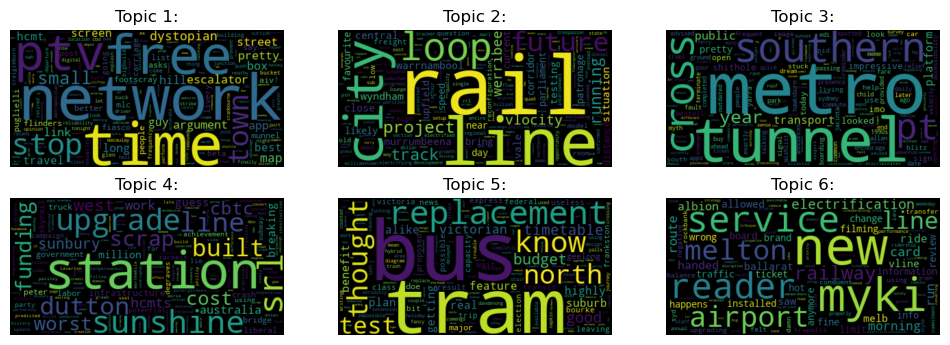

In [25]:
# display wordcloud
displayWordcloud(ldaModel, tfFeatureNames)

In [26]:
#------------------ bigrams --------------------
#
# Count Vectorizer
#

bigramVectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=featureNum, stop_words='english', ngram_range=(2, 2))
bg_tf = bigramVectorizer.fit_transform(processedPosts)
# extract the names of the features (in our case, the words)
bg_tfFeatureNames = bigramVectorizer.get_feature_names_out()


#
# LDA MODEL
#

# Run LDA (see documentation about what the arguments means)
bg_ldaModel = LatentDirichletAllocation(n_components =topicNum, max_iter=10, learning_method='online').fit(bg_tf)

In [27]:
display_topics(bg_ldaModel, bg_tfFeatureNames, wordNumToDisplay)

Topic 0:
parliament escalator asks box hill mlc puglielli parliament central asks mlc central escalator fiasco aiv hill fiasco aiv feature benefit benefit alike hcmts feature alike good highly hcmts guess station
Topic 1:
cbtc close murrumbeena running close murrumbeena transport public likely suburb station near suburb station future likely bus replacement replacement line card myki ptv building test beta link ptv better help
Topic 2:
argument pt pt stop free argument airport tunnel airport melton link electrification albion rail map link electrification albion new map melton new handed airport loop city blitz service service airport
Topic 3:
wyndham vale warrnambool situation vlocity line line warrnambool patronage low electrifying wyndham vale line screen bus federal election result federal pt victoria election pt graph ridership ridership annual srl expensive
Topic 4:
sunshine station station upgrade dutton funding srl sunshine funding scrap scrap srl time pretty small town pretty 

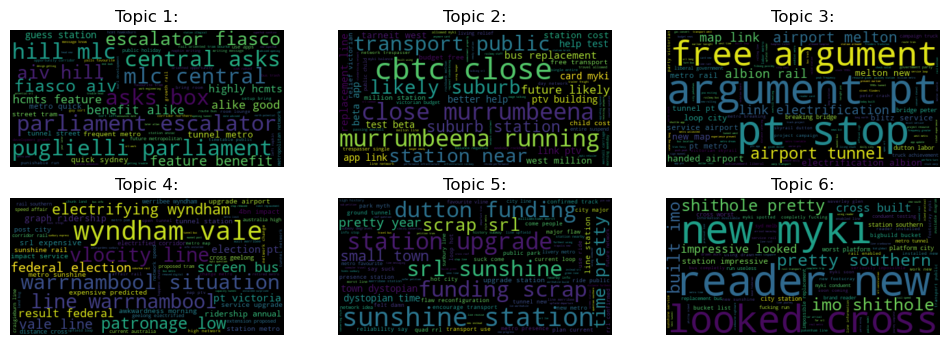

In [28]:
# display wordcloud
displayWordcloud(bg_ldaModel, bg_tfFeatureNames)

## Sentiment Analysis (VADER)

In [30]:
#----------------------- VADER approach -----------------------------
def vaderPrintTokens(lTokens, dSentimentScores):
    """
    Print out the tokens and sentiment score.
    
    @param lTokens: List of tokens to print and colour.
    @dSentimentScores: Dictionary of sentiment from Vader.

    """
    print(*lTokens, sep=', ')
    for cat,score in dSentimentScores.items():
        print('{0}: {1}, '.format(cat, score), end='')
    print()

In [31]:
def vaderSentimentAnalysis(sTweetsFilename, bPrint, tweetProcessor):
    """
    Use Vader lexicons instead of a raw positive and negative word count.

    @param sTweetsFilename: name of input file containing a json formatted tweet dump
    @param bPrint: whether to print the stream of tokens and sentiment. Uses colorama to highlight sentiment words.
    @param tweetProcessor: TweetProcessing object, used to pre-process each tweet.

    @returns: list of tweets, in the format of [date, sentiment]
    """

    # this is the vader sentiment analyser, part of nltk
    sentAnalyser = SentimentIntensityAnalyzer()


    lSentiment = []
    # open file and process tweets, one by one
    with open(sTweetsFilename, 'r', encoding='utf-8', errors='ignore') as f:
        redditDump = json.load(f)
        
        for submission in redditDump:
            postText = submission['post_title']
            postDate = submission['post_created_date']
            
            # compute sentiment scores for the post
            dSentimentScores = sentAnalyser.polarity_scores(postText)

            # save the date and sentiment of each post (used for time series)
            lSentiment.append([pd.to_datetime(postDate), dSentimentScores['compound']])

            # if we are printing, print the post text and sentiment scores
            if bPrint:
                print(postText, dSentimentScores)

            # Process the comment (assuming comments are included in the submission)
            if 'comment_body' in submission:  # checking if there is a comment
                commentText = submission['comment_body']
                commentDate = submission['comment_created_date']

                # compute sentiment scores for the comment
                dSentimentScores = sentAnalyser.polarity_scores(commentText)

                # save the date and sentiment of each comment (used for time series)
                lSentiment.append([pd.to_datetime(commentDate), dSentimentScores['compound']])

                # if we are printing, print the comment text and sentiment scores
                if bPrint:
                    print(commentText, dSentimentScores)

    return lSentiment


In [32]:
# input file of set of reddit posts (json format)
redditFile = 'melb_trains_reddit_data.json'
# flag to determine whether to print out tweets and their sentiment
flagPrint = True

In [33]:
#applying the same pre-processing steps to the data for these models

# construct the reddit pro-processing object
# use tweet tokenizer
tweetTokenizer = TweetTokenizer()
lPunct = list(string.punctuation)
# standard 'English' stopwords plus we want to remove things like 'rt' (retweet) etc
lStopwords = stopwords.words('english') + lPunct + ['rt', 'via', '...', '…', '"', "'", '`']
tweetLemmatizer = nltk.WordNetLemmatizer()  

# call the RedditProcessing python script
redditProcessor = RedditProcessing.RedditProcessing(tweetTokenizer, lStopwords, lemmatizer=tweetLemmatizer, filter_out_terms=filter_out_terms)

In [34]:
lSentiment = vaderSentimentAnalysis(redditFile, flagPrint, redditProcessor)

Retrofitted info board with new solar panel and e-ink screen {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Good thing they have the display there for a stop that appears to have approximately zero services on weekends! {'neg': 0.103, 'neu': 0.748, 'pos': 0.149, 'compound': 0.2481}
Retrofitted info board with new solar panel and e-ink screen {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
I've seen ones that were recently installed and then vandalised and then removed completely {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Another Puffing Billy item {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Cool! {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.3802}
How do use trams? {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
They are busses on train tracks. If you know how to use a bus you can do a tram.

As far as zones go. I think all trams are zone 1(+2?) so you don't really need to worry. Touch on when you get on the tram, touch off of you want a 2hr

C:\Users\belle\AppData\Local\Temp\ipykernel_23356\2477531526.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  sentiment_df.resample('1H').sum().plot()


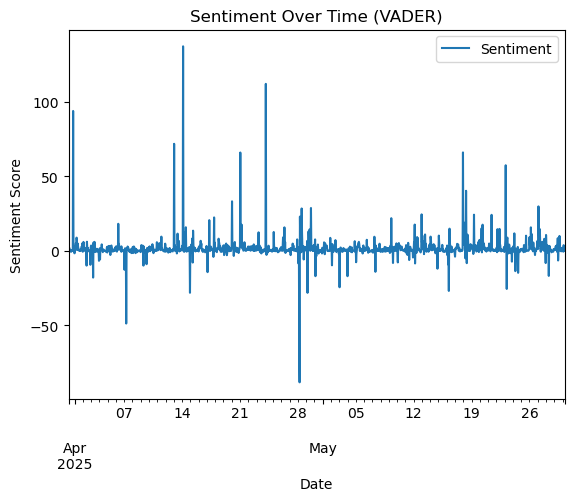

In [35]:
#----------------------- Time series of sentiment scores -----------------------------
def plot_sentiment_time_series(lSentiment):
    sentiment_df = pd.DataFrame(lSentiment, columns=['Timestamp', 'Sentiment']).set_index('Timestamp')
    sentiment_df[['Sentiment']] = sentiment_df[['Sentiment']].apply(pd.to_numeric)
    sentiment_df.resample('1H').sum().plot()
    plt.title('Sentiment Over Time (VADER)')
    plt.xlabel('Date')
    plt.ylabel('Sentiment Score')
    plt.show

plot_sentiment_time_series(lSentiment)

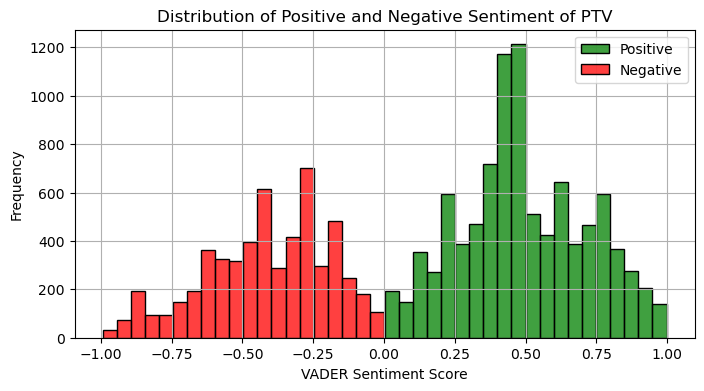

In [36]:
#--------------------------------- Computing sentiment scores ---------------------------------
# only positive or negative sentiments (disregards neutral)
pos = [s[1] for s in lSentiment if s[1] > 0]
neg = [s[1] for s in lSentiment if s[1] < 0]

# visualising
plt.figure(figsize=(8, 4))
sns.histplot(pos, color='green', label='Positive', bins=20)
sns.histplot(neg, color='red', label='Negative', bins=20)

plt.xlabel('VADER Sentiment Score')
plt.ylabel('Frequency')
plt.title('Distribution of Positive and Negative Sentiment of PTV')
plt.legend()
plt.grid(True)
plt.show()



### Word clouds of most frequent words in negative and positive sentiments posts/comments

In [37]:
from wordcloud import WordCloud

def preprocess_text(text, tokenizer, lemmatizer, stopwords, filter_out_terms, regex_pattern):
    text = re.sub(regex_pattern, ' ', text)
    tokens = tokenizer.tokenize(text)
    tokens = [lemmatizer.lemmatize(t.lower()) for t in tokens]
    tokens = [t for t in tokens if t not in stopwords and t not in filter_out_terms and t.isalpha()]
    return tokens

def vaderSentimentAnalysisWithText(sTweetsFilename, tweetTokenizer, tweetLemmatizer, lStopwords, filter_out_terms, regex_pattern):
    sentAnalyser = SentimentIntensityAnalyzer()
    sentiment_data = []
    with open(sTweetsFilename, 'r', encoding='utf-8', errors='ignore') as f:
        redditDump = json.load(f)
        for submission in redditDump:
            # posts
            postText = submission.get('post_title', '')
            postDate = submission.get('post_created_date', None)
            dSentimentScores = sentAnalyser.polarity_scores(postText)
            sentiment_data.append([postDate, dSentimentScores['compound'], postText])

            # comments
            if 'comment_body' in submission:
                commentText = submission['comment_body']
                commentDate = submission.get('comment_created_date', None)
                dSentimentScores = sentAnalyser.polarity_scores(commentText)
                sentiment_data.append([commentDate, dSentimentScores['compound'], commentText])
    return sentiment_data

In [38]:
sentiment_data = vaderSentimentAnalysisWithText(redditFile, tweetTokenizer, tweetLemmatizer, lStopwords, filter_out_terms, regex_pattern)

In [39]:
def plot_wordcloud(freq_counter, title, ax, colormap):
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap=colormap).generate_from_frequencies(freq_counter)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(title)

In [40]:
#--------------------------- Terms neg/pos wordclouds --------------------------------
# positive and negative posts/comments (disregards neutral posts/comments)
positive_texts = [item[2] for item in sentiment_data if item[1] > 0]
negative_texts = [item[2] for item in sentiment_data if item[1] < 0]

# same preprocessing on them again
pos_tokens = []
for text in positive_texts:
    pos_tokens.extend(preprocess_text(text, tweetTokenizer, tweetLemmatizer, lStopwords, filter_out_terms, regex_pattern))

neg_tokens = []
for text in negative_texts:
    neg_tokens.extend(preprocess_text(text, tweetTokenizer, tweetLemmatizer, lStopwords, filter_out_terms, regex_pattern))

# frequency of pos and neg posts/comments
pos_freq = Counter(pos_tokens)
neg_freq = Counter(neg_tokens)

In [41]:
#---------------------- Bigram neg/pos wordclouds --------------------------
# positive bigrams
pos_bigrams = []
for text in positive_texts:
    tokens = preprocess_text(text, tweetTokenizer, tweetLemmatizer, lStopwords, filter_out_terms, regex_pattern)
    pos_bigrams.extend(list(bigrams(tokens)))

# negative bigrams
neg_bigrams = []
for text in negative_texts:
    tokens = preprocess_text(text, tweetTokenizer, tweetLemmatizer, lStopwords, filter_out_terms, regex_pattern)
    neg_bigrams.extend(list(bigrams(tokens)))

# bigrams freq
pos_bigram_freq = Counter(pos_bigrams)
neg_bigram_freq = Counter(neg_bigrams)

pos_bigram_freq_str = {"_".join(b): count for b, count in pos_bigram_freq.items()}
neg_bigram_freq_str = {"_".join(b): count for b, count in neg_bigram_freq.items()}

Text(0.5, 0.65, 'Positive Sentiment Word Clouds')

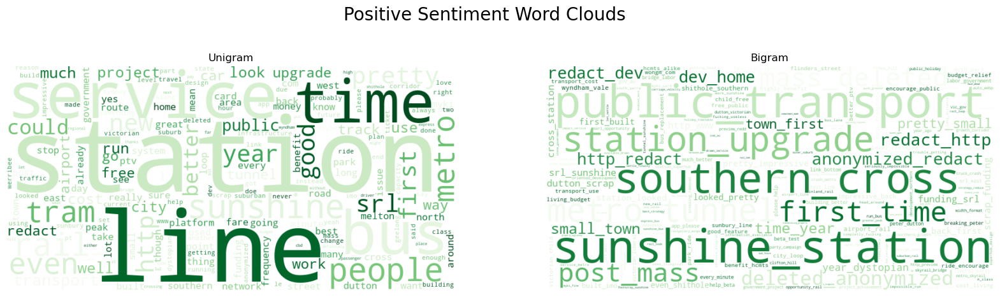

In [42]:
fig, axs = plt.subplots(1, 2, figsize=(20, 16))

plot_wordcloud(pos_freq, 'Unigram', axs[0], colormap='Greens')
plot_wordcloud(pos_bigram_freq_str, 'Bigram', axs[1], colormap='Greens')

fig.text(0.5, 0.65, 'Positive Sentiment Word Clouds', ha='center', fontsize=20)


Text(0.5, 0.65, 'Negative Sentiment Word Clouds')

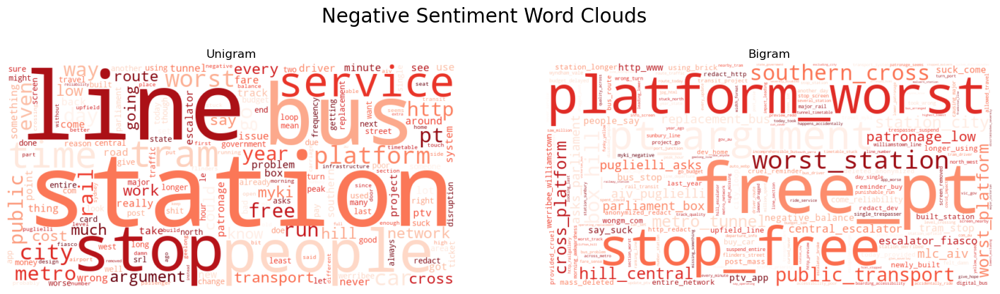

In [43]:
fig, axs = plt.subplots(1, 2, figsize=(18, 14))

plot_wordcloud(neg_freq, 'Unigram', axs[0], colormap='Reds')
plot_wordcloud(neg_bigram_freq_str, 'Bigram', axs[1], colormap='Reds')

fig.text(0.5, 0.65, 'Negative Sentiment Word Clouds', ha='center', fontsize=20)

## Networks

In [45]:
#-------------------------- Reply Graph -----------------------------------------------
def get_posts_network(sSubredditName, days=60, limit=None):
    from datetime import datetime, timedelta, timezone
    subreddit = client.subreddit(sSubredditName)
    end_time = datetime.now(timezone.utc)
    start_time = end_time - timedelta(days=days)

    posts = []
    try:
        for submission in subreddit.new(limit=limit):
            post_time = datetime.fromtimestamp(submission.created_utc, tz=timezone.utc)
            if post_time < start_time:
                break

            if submission.author is None:
                continue

            post_data = {
                'post_id': submission.name,
                'author': submission.author.name,
                'title': submission.title,
                'score': submission.score,
                'created_date': post_time.strftime('%Y-%m-%d %H:%M:%S'),
                'url': submission.url,
                'comments': []
            }

            submission.comments.replace_more(limit=0)
            for comment in submission.comments.list():
                if comment.author is None:
                    continue

                comment_time = datetime.fromtimestamp(comment.created_utc, tz=timezone.utc)
                post_data['comments'].append({
                    'comment_id': comment.name, #added elements needed for reply graph
                    'parent_id': comment.parent_id,
                    'author': comment.author.name,
                    'body': comment.body,
                    'created_date': comment_time.strftime('%Y-%m-%d %H:%M:%S')
                })

            posts.append(post_data)

    except Exception as e:
        print(f"An error occurred: {e}")

    return posts

In [46]:
posts = get_posts_network('MelbourneTrains', days=60, limit=1000)

In [47]:
# construct directed graph
replyGraph = nx.DiGraph()

# this dictionary used to track the ids of submissions and posts, in order for us to construct
# the links in the graph
dSubCommentId = dict()

# specify which subreddit we are interested in - 'python'
subreddit = client.subreddit('MelbourneTrains')

# specify file name 
sFileName = "replyGraph_reliability.graphml"

In [48]:
for post in posts:
    # check if author name is in the reply graph - if so, we update the number of submissions
    # associated with this user
    # if not, we construct a new node with 1 associated submission
    if post['author'] in replyGraph:
        replyGraph.nodes[post['author']]['subNum'] += 1
    else:
        replyGraph.add_node(post['author'], subNum=1)

    submissionId = post['post_id']
    # this stores the submissionId (in submission.name) and associate it to the author
    # (submission.author.name).
    dSubCommentId[submissionId] = {submissionId: post['author']}

    # for the current submission, retrieve the associated comments
    for comment in post['comments']:
        author = comment['author']

        # map comment id to author
        dSubCommentId[submissionId][comment['comment_id']] = author

        # check if we have seen the comment's parent yet.  If not, then parent comment has been
        # deleted
        if comment['parent_id'] in dSubCommentId[submissionId]:
            # if edge exists, increment the replyNum, otherwise add a new edge
            parent_author = dSubCommentId[submissionId][comment['parent_id']]

            if replyGraph.has_edge(author, parent_author):
                replyGraph[author][parent_author]['replyNum'] += 1
            else:
                # need to check if the nodes have been added yet, if not add it and set subNum to 0
                if author not in replyGraph:
                    replyGraph.add_node(author, subNum=0)
                if parent_author not in replyGraph:
                    replyGraph.add_node(parent_author, subNum=0)
                replyGraph.add_edge(author, parent_author, replyNum=1)

print(replyGraph.nodes)
nx.readwrite.write_graphml(replyGraph, sFileName)

['Fantastic-Net9381', 'predictableghost', 'Jimbo_101', 'altandthrowitaway', 'Not_MyName', 'Drmcwacky', 'Melb_Tom', 'True-Worldliness6411', 'Away_Ad3169', 'jdgordon', 'Silver-Chemistry2023', 'x404Void', 'No-Mammoth8874', 'FrostyBlueberryFox', 'gidix492', 'haztech99', 'monsterfcker69', 'letterboxfrog', 'Tameem_alkadi', 'mangolamplight', 'ptoomey1', 'IlyaPFF', 'sostopher', 'Recent_Carpenter8644', 'TheTeenSimmer', 'Top_Breadfruit_5150', 'wiserthanyouu', 'OneParamedic4832', 'Electrical-Theme9981', 'Wet_Unicorn03', 'okraspberryok', 'LisD1990', 'Comeng17', 'itsrileyandexe', 'Alfreddo30', 'Mashiko4', 'BadBoyJH', 'alexmc1980', 'whoorderedsquirrel', 'immortal_bandicoot', 'virkendie', 'EndlessSuffering4', 'Passenger_deleted', 'Mindless-Dig2879', 'Consistent_Cup_5210', 'bleeeer', 'HiVeMiNdOfStUpId', 'Mechanical-Capybara', 'Square_Extension_950', 'ShyCrystal69', 'guseyk', 'wongm', 'lanson15', 'drunk_haile_selassie', 'cleanestbestposter', 'Speedy-08', 'lv426ishome', 'No-Bison-5397', 'Ich_mag_Kartoff

### Community Detection

In [110]:
# read the reply graph in
replyGraph = nx.readwrite.read_graphml(sFileName)

# louvain
# Placeholder, replace right hand side
dLouvainComms = community.best_partition(nx.to_undirected(replyGraph))
print(dLouvainComms)

# this code converts output of Louvain to the same format as CPM (makes it easier to have one consistent interface)
louvanCommNum = max([y for (x,y) in dLouvainComms.items()]) + 1
lLouvainComms = dictToSetFormat(dLouvainComms, louvanCommNum)

# louvain labels, stored in node attribute 'louvain'
for clusId, lComms in enumerate(lLouvainComms):
    for nodeId in lComms:
        replyGraph.nodes[nodeId]['louvain'] = clusId

# Output modified graph with prefix mod2 to original file
#nx.readwrite.write_graphml(replyGraph, 'mod2' + sFileName, infer_numeric_types=True)


{'Public Transport Victoria': 0, '@no.1machopfan503': 0, '@michaeltran5864': 0, 'Melbourne City Institute of Education': 1, '@Lucasws575': 1, '@jt2449': 1, '@sleepythespian1455': 1, '@SaarrrSaarrr': 1, '@Traption': 1, '@igorperfeitovivo': 1, '@tylerdotapp': 1, '@alishiraz9979': 3, '@tobyb6248': 3, '@thenewbb': 1, '@lifeofjade-today': 1, '@soRekE_Studio': 1, '@herk77hk': 1, '@charlespg3d190': 1, '@19xxmichelle': 1, '@traxplane': 1, '@KayneHorwood': 1, '@VicSpotters': 1, '@deviousjupiter8606': 1, '@scagren': 1, '@trainjedi9651': 1, '@jalflight351': 1, '@SYDTrainsFilms': 3, '@Comeng_': 3, '@sunnyman3002': 1, 'Internash': 4, '@Internash': 4, '@BreakingJJC': 4, '@sherintalkzaustralia': 4, '@britsluver': 4, '@rushil6697': 4, '@meesalikeu': 4, '@michyao': 4, '@dalangie': 4, '@cahpintermail': 4, '@MrClemmo13': 4, '@corporate_marshmallow': 4, '@sureshchandraverma4378': 4, '@yorkemar': 4, '@footyfan101ful': 4, '@hell_girl1286': 4, '@redcaverecords5784': 4, '@naturelife2473': 4, '@victorianrichar

In [111]:
louvainGraph = nx.readwrite.write_graphml(replyGraph, 'mod2' + sFileName, infer_numeric_types=True)

In [112]:
#--------- computing modularity as measure for louvain --------------------
modularity_score = community.modularity(dLouvainComms, nx.to_undirected(replyGraph))
print("Louvain Modularity:", modularity_score)


Louvain Modularity: 0.8965867435851212


In [ ]:
#----------- influential node -------------
# computing katz centrality
katz_centrality = nx.katz_centrality(replyGraph, alpha=0.005, beta=1.0, max_iter=1000, tol=1e-06)

# nodes by katz centrality
top_influential = sorted(katz_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

print("Top 10 influential nodes by Katz centrality:")
for node, score in top_influential:
    print(f"{node}: {score:.6f}")


In [ ]:
# adding katz centrality to the replygraph
for node, score in katz_centrality.items():
    replyGraph.nodes[node]['katz'] = score

nx.write_graphml(replyGraph, 'replyGraph_katz_reliability.graphml', infer_numeric_types=True)

In [ ]:
# putting louvain and katz (community detection and influential users detection) in one graph
g_louvain = nx.read_graphml("mod2replyGraph_reliability.graphml")
g_katz = nx.read_graphml("replyGraph_katz_reliability.graphml")

for node in g_louvain.nodes():
    if node in g_katz.nodes() and 'katz' in g_katz.nodes[node]:
        g_louvain.nodes[node]['katz'] = g_katz.nodes[node]['katz']

nx.write_graphml(g_louvain, "replyGraph_louvain_katz_reliability.graphml")


### Independent Cascade Model on Negative Sentiment Posts/Comments

In [ ]:
def vaderSentimentAnalysisICM(posts, bPrint=False):
    """
    Performs VADER sentiment analysis on a list of Reddit posts and their comments.

    @param posts: List of post dictionaries, each with keys 'author', 'title', 'created_date', and 'comments'
    @param bPrint: Boolean flag to control printing of sentiment results

    @returns: list of tuples in the format (author_username, date, compound_sentiment_score)
    """
    sentAnalyser = SentimentIntensityAnalyzer()
    lSentiment = []

    for post in posts:
        postText = post['title']
        postDate = post['created_date']
        postAuthor = post['author']  # added: get author from post

        # compute sentiment scores for the post title
        postSentiment = sentAnalyser.polarity_scores(postText)
        lSentiment.append((postAuthor, pd.to_datetime(postDate), postSentiment['compound']))

        if bPrint:
            print(f"[POST] {postAuthor}: {postText} → {postSentiment}")

        # process all comments under the post
        for comment in post['comments']:
            commentText = comment['body']
            commentDate = comment['created_date']
            commentAuthor = comment['author']  # added: get author from comment

            # compute sentiment scores for the comment
            commentSentiment = sentAnalyser.polarity_scores(commentText)
            lSentiment.append((commentAuthor, pd.to_datetime(commentDate), commentSentiment['compound']))

            if bPrint:
                print(f"[COMMENT] {commentAuthor}: {commentText} → {commentSentiment}")

    return lSentiment


In [ ]:
lSentiment = vaderSentimentAnalysisICM(posts, bPrint=False)

In [ ]:
# cascade model seed nodes
replyGraphUsers = {str(user).lower() for user in replyGraph.nodes}
negative_nodes = [author.lower() for author, _, score in lSentiment if score < 0 and author and author != '[deleted]']
seed_nodes = [node for node in negative_nodes if node in replyGraph.nodes]

print(f"Number of seed nodes: {len(seed_nodes)}")

In [ ]:
def independentCascade(graph, trialNum, lSeed, activationProb):

    lAvgActivationsPerNode = [0 for _ in range(nx.number_of_nodes(graph))]
    lAvgActivationsPerIteration = []

    node_list = list(graph.nodes())
    node_index = {node: i for i, node in enumerate(node_list)}

    print('starting cascade run')
    for i in range(trialNum):
        print('Trial/run no. {}'.format(i))

        setActive = set(lSeed)
        setLastActive = set(lSeed)
        setNewActive = set()
    
        while len(setLastActive) > 0:
            for curNode in setLastActive:
                for neighbour in graph.neighbors(curNode):
                    if neighbour not in setActive and neighbour not in setNewActive:
                        if random.random() < activationProb:
                            setNewActive.add(neighbour)

            setLastActive = setNewActive
            setActive.update(setNewActive)
            setNewActive = set()

        for x in setActive:
            lAvgActivationsPerNode[node_index[x]] += 1
        lAvgActivationsPerIteration.append(len(setActive))

    return [float(count)/trialNum for count in lAvgActivationsPerNode], lAvgActivationsPerIteration


In [ ]:
trialNum = 10
activationProb = 0.01

lAvgActivationsPerNode, lAvgActivationsPerIteration = independentCascade(replyGraph, trialNum, lSeed=seed_nodes, activationProb=activationProb)

# cascade results back into graph
for nodeId, avgActivation in zip(replyGraph.nodes, lAvgActivationsPerNode):
    replyGraph.nodes[nodeId]['avgAct'] = avgActivation

nx.write_graphml(replyGraph, 'replyGraph_neg_sentiment_cascade.graphml')

# Youtube

In [61]:
api_key = 'PLACEHOLDER'  # placeholder to avoid security leak when uploading to github repository
youtube = build('youtube', 'v3', developerKey=api_key)

def search_shorts_videos(query, max_results=10):
    request = youtube.search().list(
        part='snippet',
        q=query,
        type='video',
        maxResults=max_results,
        videoDuration='short'  #collecting youtube shorts as they have more engagement in this topic of PTV
    )
    response = request.execute()

    video_ids = []
    for item in response['items']:
        video_ids.append(item['id']['videoId'])
    return video_ids

def get_shorts_comments(video_id, max_comments=20):
    comments = []
    try:
        request = youtube.commentThreads().list(
            part='snippet,replies',
            videoId=video_id,
            maxResults=100,
            textFormat='plainText'
        )
        response = request.execute()

        while response and len(comments) < max_comments:
            for item in response['items']:
                top_comment = item['snippet']['topLevelComment']
                c_id = top_comment['id']
                c_author = top_comment['snippet']['authorDisplayName']
                c_text = top_comment['snippet']['textDisplay']
                # top-level comment parent_id = None
                comments.append({
                    'comment_id': c_id,
                    'author': c_author,
                    'parent_id': None,
                    'text': c_text
                })

                if 'replies' in item:
                    for reply in item['replies']['comments']:
                        r_id = reply['id']
                        r_author = reply['snippet']['authorDisplayName']
                        r_text = reply['snippet']['textDisplay']
                        comments.append({
                            'comment_id': r_id,
                            'author': r_author,
                            'parent_id': c_id,
                            'text': r_text
                        })

                if len(comments) >= max_comments:
                    break

            if 'nextPageToken' in response and len(comments) < max_comments:
                request = youtube.commentThreads().list(
                    part='snippet,replies',
                    videoId=video_id,
                    maxResults=100,
                    textFormat='plainText',
                    pageToken=response['nextPageToken']
                )
                response = request.execute()
            else:
                break
    except HttpError as e:
        error_reason = e.error_details[0]['reason'] if e.error_details else 'Unknown'
        if error_reason == 'commentsDisabled':
            print(f"Comments are disabled for video ID: {video_id}. Skipping.")
        else:
            print(f"HTTP error for video ID {video_id}: {e}")
    except Exception as e:
        print(f"An unexpected error occurred for video ID {video_id}: {e}")

    return comments

# search queries to retrieve relevant information
queries = [
    "Melbourne PTV",
    "Melbourne train station",
    "Melbourne trains",
    "Victoria trains",
    "Victorian stations",
    "Melbourne trams",
    "Melbourne tram stops",
    "Melbourne buses",
]

videos = []

for q in queries:
    print(f"\nSearching videos for: {q}")
    video_ids = search_shorts_videos(q, max_results=5)

    for vid in video_ids:
        video_response = youtube.videos().list(part='snippet', id=vid).execute()
        uploader = video_response['items'][0]['snippet']['channelTitle']

        print(f"Fetching comments for video ID: {vid}")
        comments = get_shorts_comments(vid, max_comments=50)

        videos.append({
            'video_id': vid,
            'author': uploader,
            'comments': comments
        })


Searching videos for: Melbourne PTV
Fetching comments for video ID: Uog1vvo5iFw
Fetching comments for video ID: _5P63Icg7iU
Fetching comments for video ID: UU0e1DODX7Y
Fetching comments for video ID: L1oQm8fXICY
Fetching comments for video ID: Q57hExF0YFE
Comments are disabled for video ID: Q57hExF0YFE. Skipping.

Searching videos for: Melbourne train station
Fetching comments for video ID: QqXoYOtoIpM
Fetching comments for video ID: CDwe-GGUPNs
Comments are disabled for video ID: CDwe-GGUPNs. Skipping.
Fetching comments for video ID: Rm-o4CAbmNo
Fetching comments for video ID: 6j4u9iRred4
Fetching comments for video ID: Ipfh7byq_v0
Comments are disabled for video ID: Ipfh7byq_v0. Skipping.

Searching videos for: Melbourne trains
Fetching comments for video ID: CDwe-GGUPNs
Comments are disabled for video ID: CDwe-GGUPNs. Skipping.
Fetching comments for video ID: vR4lOnDnlos
Fetching comments for video ID: PROvfUw9o3o
Fetching comments for video ID: sLPLEOwL_58
Fetching comments for vi

In [99]:
#------------- replygraph user interaction graph---------------------
replyGraph = nx.DiGraph()
dVideoCommentAuthor = dict()

for video in videos:
    uploader = video['author']
    video_id = video['video_id']

    # video count
    if uploader in replyGraph:
        replyGraph.nodes[uploader]['subNum'] += 1
    else:
        replyGraph.add_node(uploader, subNum=1)

    # current video's comments into the dictionary 
    dVideoCommentAuthor[video_id] = dict()
    dVideoCommentAuthor[video_id][video_id] = uploader

    for comment in video['comments']:
        comment_id = comment['comment_id']
        author = comment['author']
        parent_id = comment.get('parent_id')  

        dVideoCommentAuthor[video_id][comment_id] = author

        # if no author
        if author not in replyGraph:
            replyGraph.add_node(author, subNum=0)

        if parent_id is None:
            parent_author = uploader
        else:
            # reply to the author of parent comment
            parent_author = dVideoCommentAuthor[video_id].get(parent_id, None)

        # adding edge if parent_author is known
        if parent_author:
            # adding edge or adding to reply count
            if replyGraph.has_edge(author, parent_author):
                replyGraph[author][parent_author]['replyNum'] += 1
            else:
                replyGraph.add_edge(author, parent_author, replyNum=1)

In [106]:
# nodeID to strings for comm detect
mapping = {node: str(node) if node else f"node_{i}" for i, node in enumerate(replyGraph.nodes())}
replyGraph = nx.relabel_nodes(replyGraph, mapping)

# removing empty nodes
nodes_to_remove = [n for n in replyGraph.nodes() if n == '']
replyGraph.remove_nodes_from(nodes_to_remove)

In [101]:
nx.write_graphml(replyGraph, "youtube_user_interaction.graphml")

In [107]:
#--------- community detection on youtube shorts ------------------
replyGraph = nx.read_graphml("youtube_user_interaction.graphml")
undirected = nx.to_undirected(replyGraph)

# running louvain
dLouvainComms = community.best_partition(undirected)

# converting dict to set
def dictToSetFormat(partition_dict, num_comms):
    comms = [set() for _ in range(num_comms)]
    for node, comm_id in partition_dict.items():
        comms[comm_id].add(node)
    return comms

louvanCommNum = max(dLouvainComms.values()) + 1
lLouvainComms = dictToSetFormat(dLouvainComms, louvanCommNum)

# assigning louvain attribute to nodes in the graph 
for clusId, lComms in enumerate(lLouvainComms):
    for nodeId in lComms:
        replyGraph.nodes[nodeId]['louvain'] = clusId

#-------------------------------------------

community_texts = defaultdict(list)

node_louvain = {node: data.get("louvain") for node, data in replyGraph.nodes(data=True)}
print(f"Total nodes with Louvain labels: {sum(1 for v in node_louvain.values() if v is not None)}")

matched_comments = 0
for video in videos:
    for comment in video['comments']:
        author = comment['author']
        if author in node_louvain and node_louvain[author] is not None:
            community_texts[node_louvain[author]].append(comment['text'])
            matched_comments += 1

for comm_id, texts in community_texts.items():
    print(f"Community {comm_id} has {len(texts)} comments")



Total nodes with Louvain labels: 568
Community 0 has 3 comments
Community 3 has 49 comments
Community 2 has 70 comments
Community 4 has 51 comments
Community 6 has 14 comments
Community 9 has 50 comments
Community 10 has 96 comments
Community 12 has 92 comments
Community 13 has 15 comments
Community 14 has 4 comments
Community 15 has 31 comments
Community 18 has 4 comments
Community 19 has 46 comments
Community 20 has 42 comments
Community 21 has 5 comments
Community 22 has 50 comments
Community 23 has 50 comments
Community 27 has 8 comments
Community 29 has 6 comments
Community 16 has 2 comments
Community 11 has 34 comments


In [103]:
louvainGraph_yt = nx.write_graphml(replyGraph, 'mod2_' + "youtube_user_interaction.graphml", infer_numeric_types=True)

In [104]:
def get_keywords(texts, top_n=10):
    # basic pre-processing of the keywords
    all_words = re.findall(r'\b\w+\b', ' '.join(texts).lower())
    words = [w for w in all_words if w not in stopwords and len(w) > 2] #filtering out stopwords
    return Counter(words).most_common(top_n) #counting freq

for comm_id, texts in community_texts.items():
    print(f"\nCommunity {comm_id} Top Keywords:")
    for word, freq in get_keywords(texts):
        print(f" - {word}: {freq}")


Community 0 Top Keywords:
 - run: 3
 - werribee: 3
 - weekend: 2
 - way: 2
 - stop: 2
 - stations: 2
 - via: 2
 - altona: 2
 - services: 1
 - laverton: 1

Community 1 Top Keywords:
 - myki: 12
 - touch: 10
 - need: 8
 - tram: 8
 - zone: 8
 - card: 7
 - travelling: 6
 - good: 6
 - still: 6
 - used: 6

Community 8 Top Keywords:
 - melbourne: 14
 - station: 10
 - clayton: 8
 - class: 7
 - line: 5
 - network: 4
 - going: 4
 - bairnsdale: 4
 - train: 4
 - service: 4

Community 4 Top Keywords:
 - card: 13
 - myki: 10
 - melbourne: 9
 - video: 9
 - know: 8
 - tram: 8
 - get: 6
 - much: 6
 - touch: 6
 - thanks: 5

Community 6 Top Keywords:
 - stations: 5
 - southern: 4
 - cross: 4
 - passengers: 4
 - year: 4
 - line: 4
 - get: 3
 - trains: 3
 - city: 2
 - crime: 2

Community 9 Top Keywords:
 - station: 6
 - batman: 6
 - melbourne: 5
 - like: 5
 - song: 3
 - stations: 3
 - richmond: 3
 - royal: 3
 - oak: 3
 - melb: 3

Community 10 Top Keywords:
 - platform: 25
 - train: 18
 - gap: 17
 - one: 1

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\belle\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!



Generating word cloud for Community 0 (3 comments)


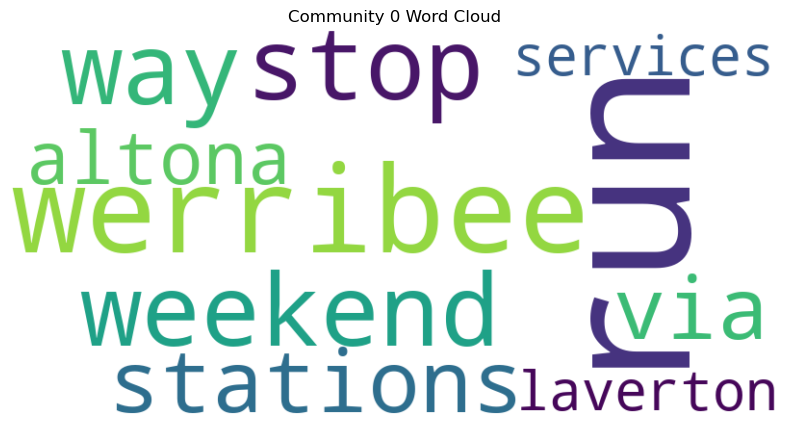


Generating word cloud for Community 3 (49 comments)


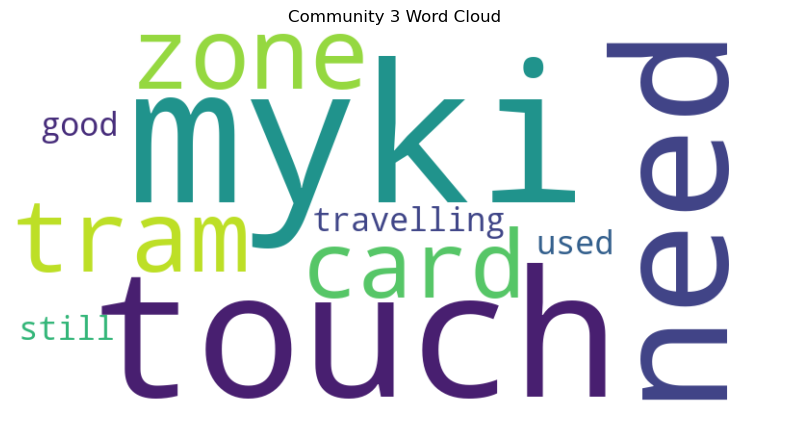


Generating word cloud for Community 2 (70 comments)


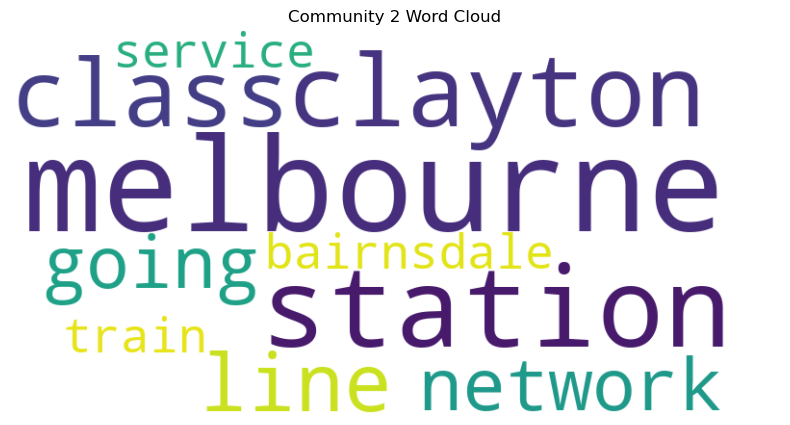


Generating word cloud for Community 4 (51 comments)


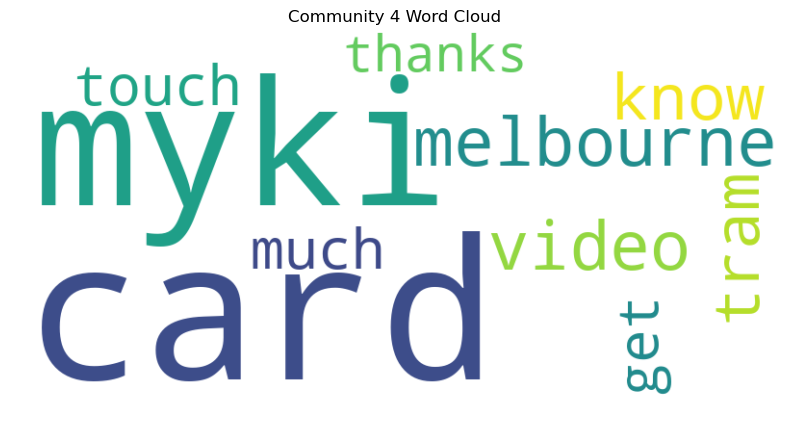


Generating word cloud for Community 6 (14 comments)


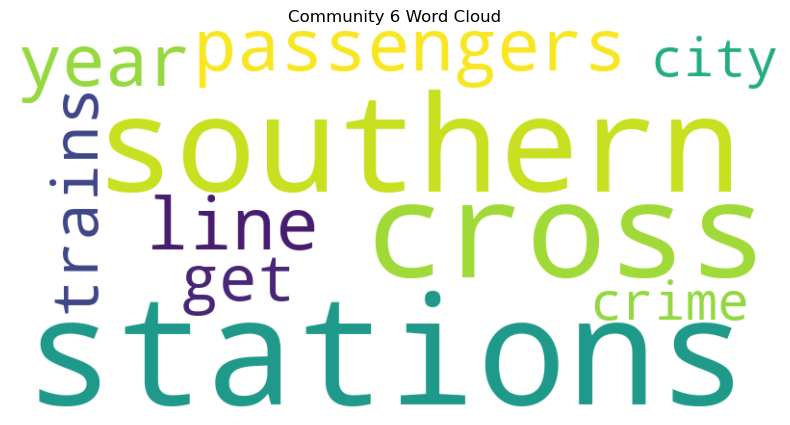


Generating word cloud for Community 9 (50 comments)


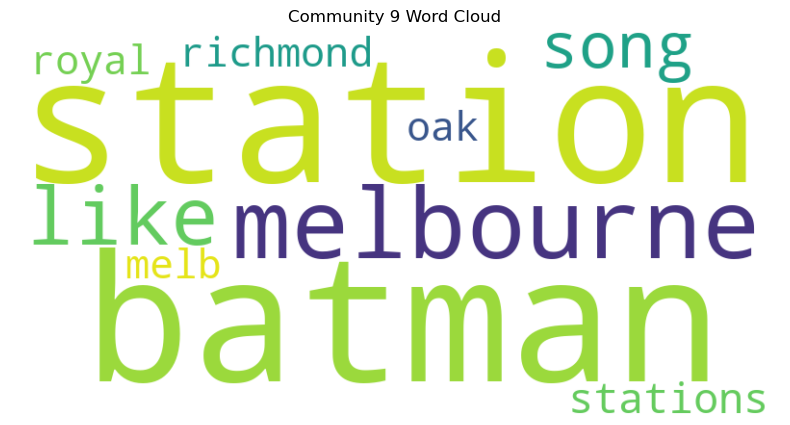


Generating word cloud for Community 10 (96 comments)


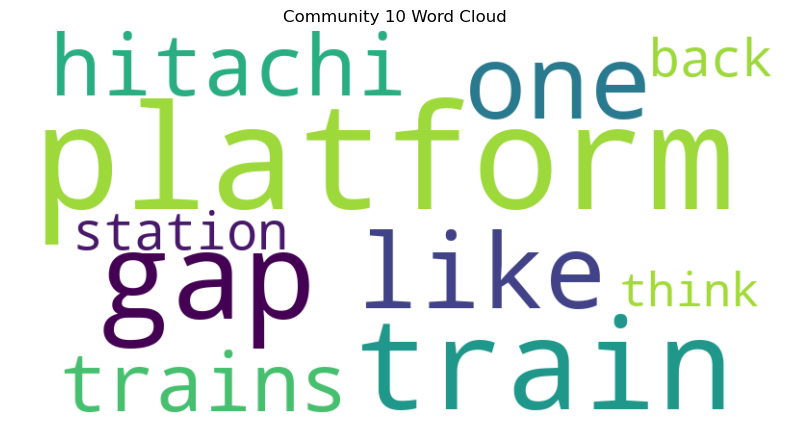


Generating word cloud for Community 12 (92 comments)


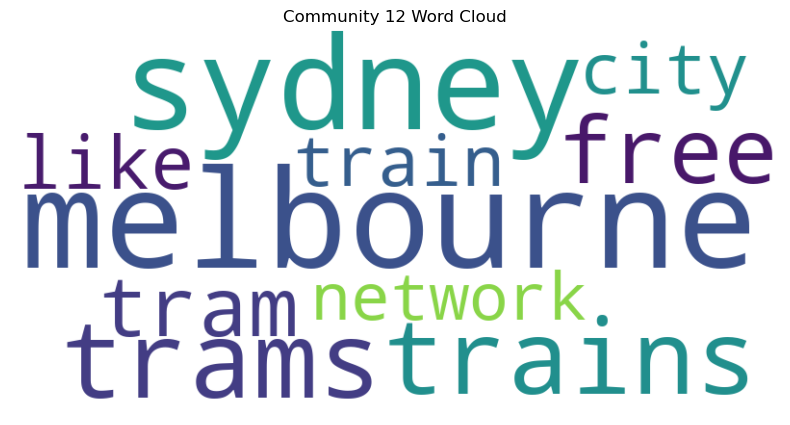


Generating word cloud for Community 13 (15 comments)


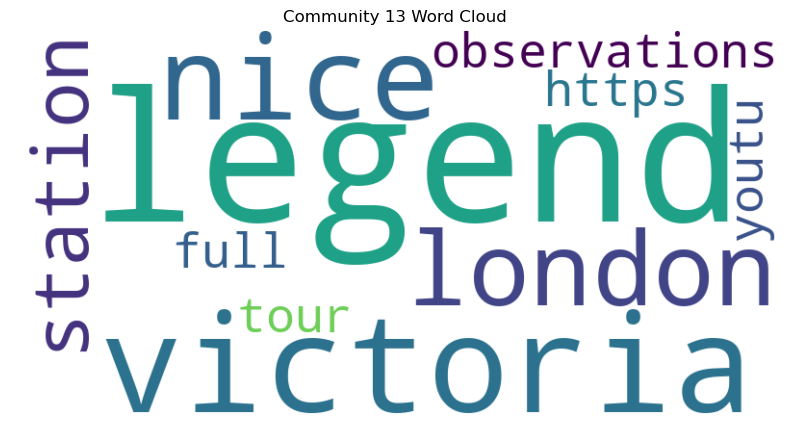


Generating word cloud for Community 14 (4 comments)


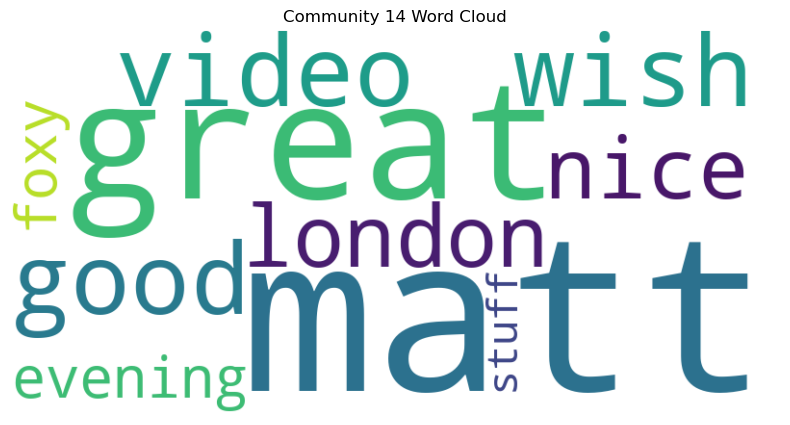


Generating word cloud for Community 15 (31 comments)


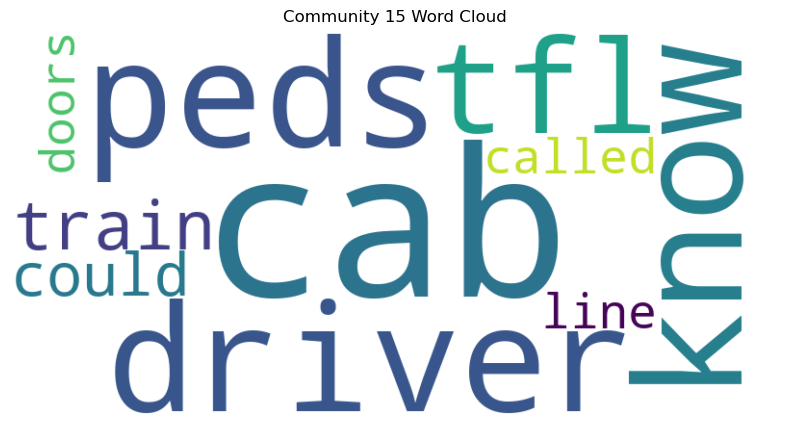


Generating word cloud for Community 18 (4 comments)


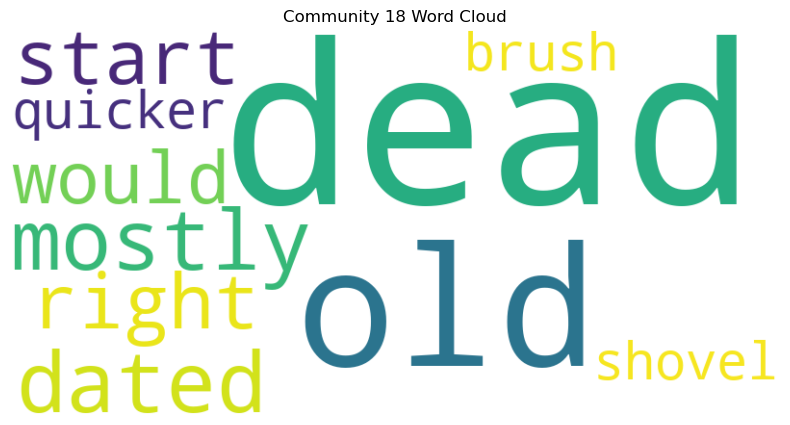


Generating word cloud for Community 19 (46 comments)


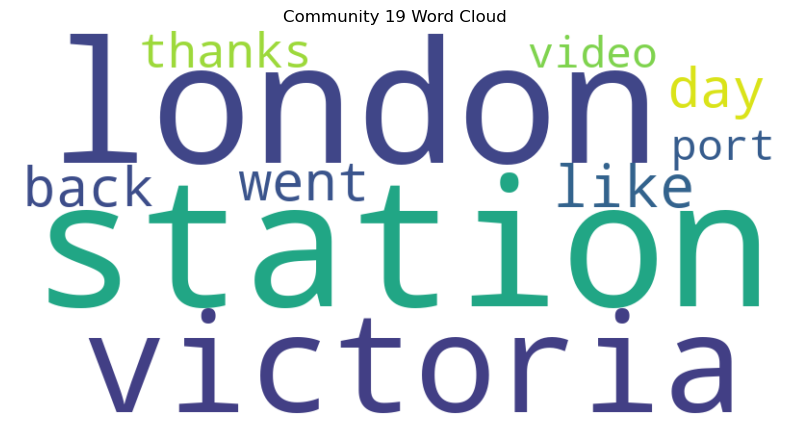


Generating word cloud for Community 20 (42 comments)


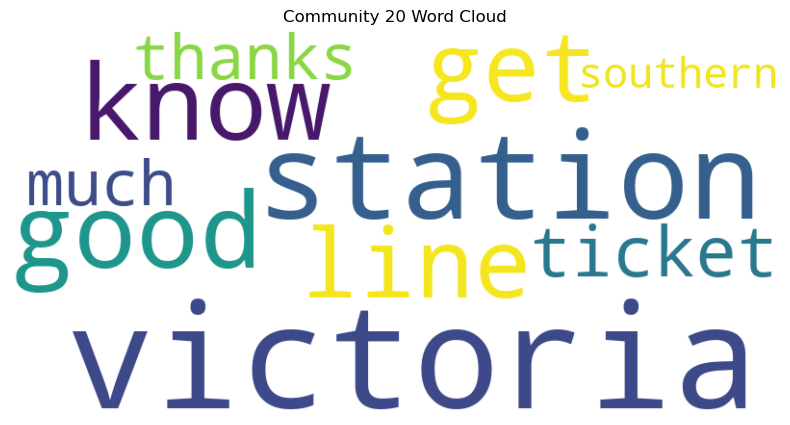


Generating word cloud for Community 21 (5 comments)


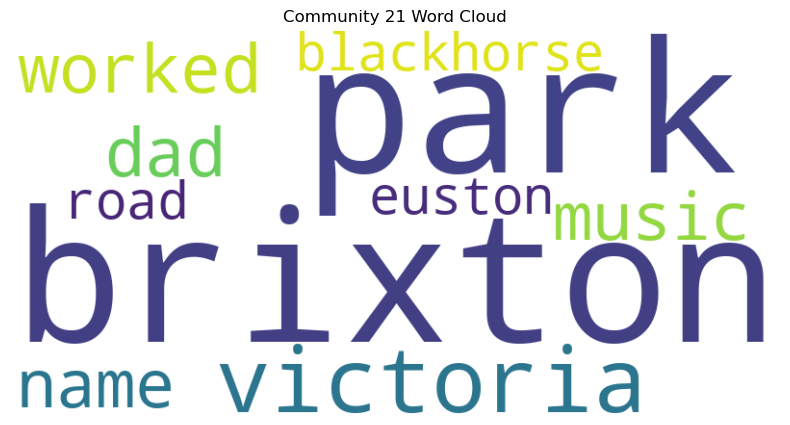


Generating word cloud for Community 22 (50 comments)


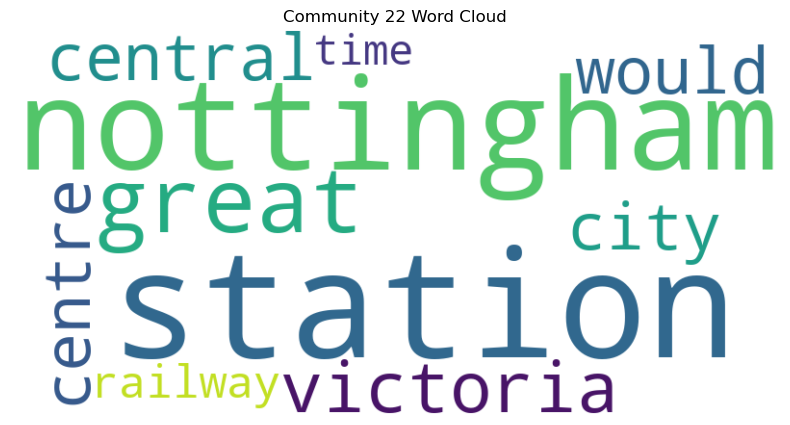


Generating word cloud for Community 23 (50 comments)


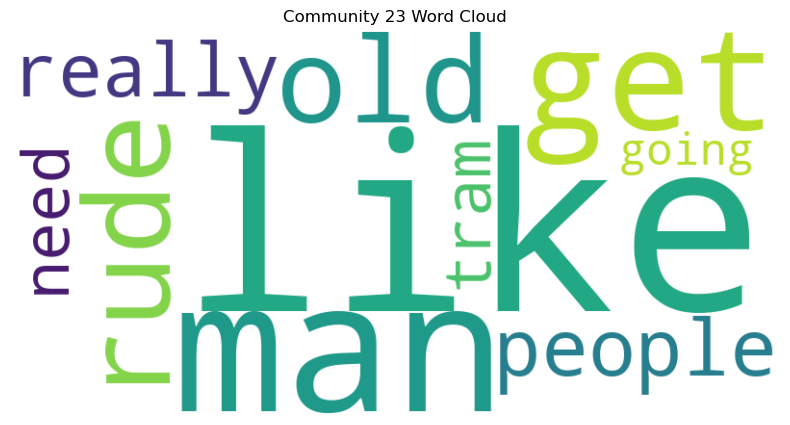


Generating word cloud for Community 27 (8 comments)


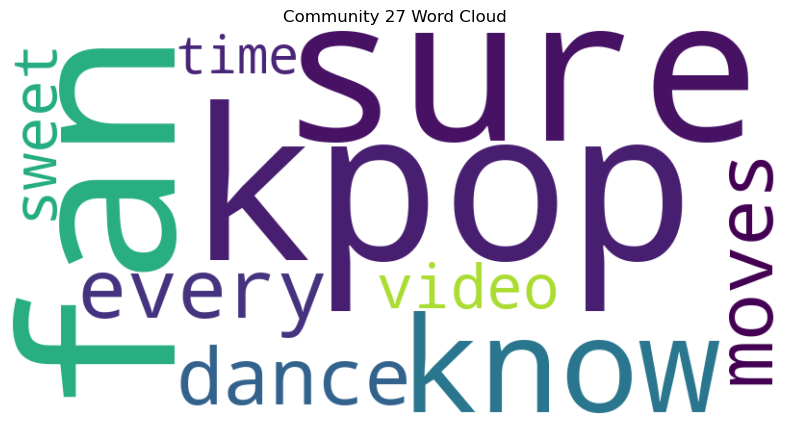


Generating word cloud for Community 29 (6 comments)


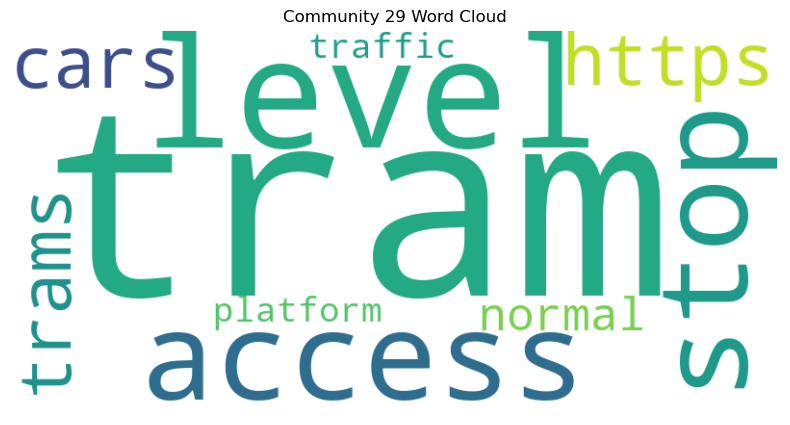


Generating word cloud for Community 16 (2 comments)


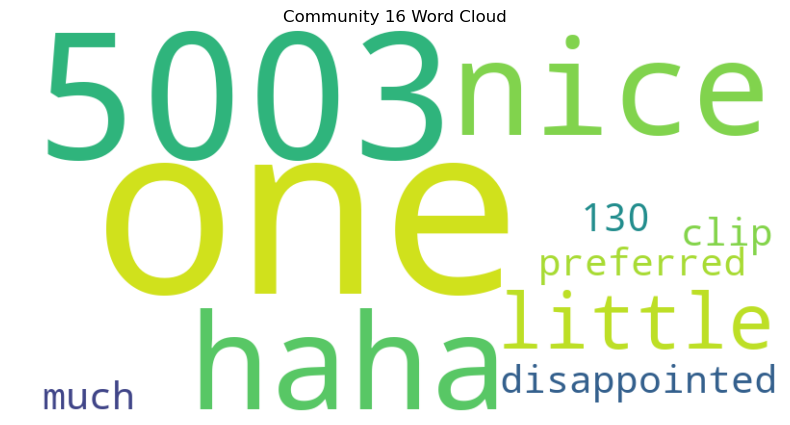


Generating word cloud for Community 11 (34 comments)


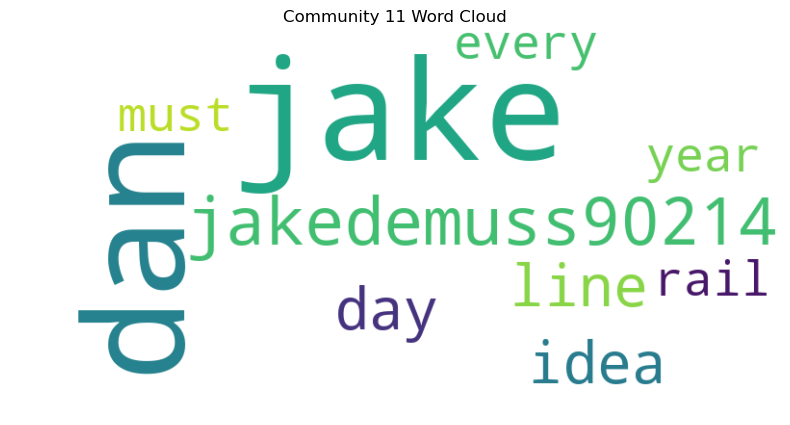

In [108]:
#------------ word clouds for youtube shorts communities ----------------------
for comm_id, texts in community_texts.items():
    print(f"\nGenerating word cloud for Community {comm_id} ({len(texts)} comments)")

    word_freq = dict(get_keywords(texts))  # convert list of tuples to dict
    if not word_freq:
        print(f" - Skipped (no valid words)")
        continue

    # word clouds
    wc = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Community {comm_id} Word Cloud")
    plt.show()